# Analyzing Demographic Differences in OKCupid Dating Profiles

### Completed:  June 14, 2018

In this project we look into the demographics of San Francisco inhabitants and study the differences between the male and female populations. We see if gender correlates to a person’s age, drinking preferences, height, education level, and specific priorities. Our dataset comes from the public profiles of users on an online dating site, OKCupid, and was collected on 06/30/12. It consists of almost 60,000 profiles within a 25 mile radius of San Francisco and included anyone who had logged in within the last year of the date of the data pull.

Our main goal is to pinpoint some of the defining features of the San Francisco population and to see what stands out between males and females. 

To do that, we aim to address the following questions:
- What is the general demographic of the users? (e.g., male:female, age range, education)
- How do male drinking habits compare to female drinking habits?
- Can we predict someone’s gender based on their height?
- Does gender play a role in the type of education that users receive(d)?
- What are the differences in priorities between males and females?

### Summary of Results

We found that most of the users were male, females had a higher tendency to drink “desperately” during their 20s to 30s, a logistic model can predict use height to predict gender with ~83% accuracy, and, while males and females have largely similar priorities, there is a still a trend in their different responses.

In [47]:
from client.api.notebook import Notebook
ok = Notebook('final-project.ok')
_ = ok.auth(inline=True)

Assignment: final-project
OK, version v1.14.15

Successfully logged in as ehkong@ucsb.edu


In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
sns.set()
%matplotlib inline

In [3]:
okcupid = pd.read_csv("okcupid_profiles.csv")

Since the data comes from people in San Francisco and a majority of the data set includes people from California, we filter the dataset to only include Californians. The non-Californians are treated as outliers.

In [4]:
justCA = okcupid[okcupid['location'].str.contains('california')]
justCA.head()

,age,body_type,diet,drinks,drugs,education,essay0,essay1,essay2,essay3,...,location,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status
0,22,a little extra,strictly anything,socially,never,working on college/university,about me:<br />\n<br />\ni would love to think...,currently working as an international agent fo...,making people laugh.<br />\nranting about a go...,"the way i look. i am a six foot half asian, ha...",...,"south san francisco, california","doesn&rsquo;t have kids, but might want them",straight,likes dogs and likes cats,agnosticism and very serious about it,m,gemini,sometimes,english,single
1,35,average,mostly other,often,sometimes,working on space camp,i am a chef: this is what that means.<br />\n1...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,...,"oakland, california","doesn&rsquo;t have kids, but might want them",straight,likes dogs and likes cats,agnosticism but not too serious about it,m,cancer,no,"english (fluently), spanish (poorly), french (...",single
2,38,thin,anything,socially,NaN,graduated from masters program,"i'm not ashamed of much, but writing public te...","i make nerdy software for musicians, artists, ...",improvising in different contexts. alternating...,my large jaw and large glasses are the physica...,...,"san francisco, california",NaN,straight,has cats,NaN,m,pisces but it doesn&rsquo;t matter,no,"english, french, c++",available
3,23,thin,vegetarian,socially,NaN,working on college/university,i work in a library and go to school. . .,reading things written by old dead people,playing synthesizers and organizing books acco...,socially awkward but i do my best,...,"berkeley, california",doesn&rsquo;t want kids,straight,likes cats,NaN,m,pisces,no,"english, german (poorly)",single
4,29,athletic,NaN,socially,never,graduated from college/university,hey how's it going? currently vague on the pro...,work work work work + play,creating imagery to look at:<br />\nhttp://bag...,i smile a lot and my inquisitive nature,...,"san francisco, california",NaN,straight,likes dogs and likes cats,NaN,m,aquarius,no,english,single


# Distribution of Users by Age and Gender

First, we look at the age distribution for both males and females.

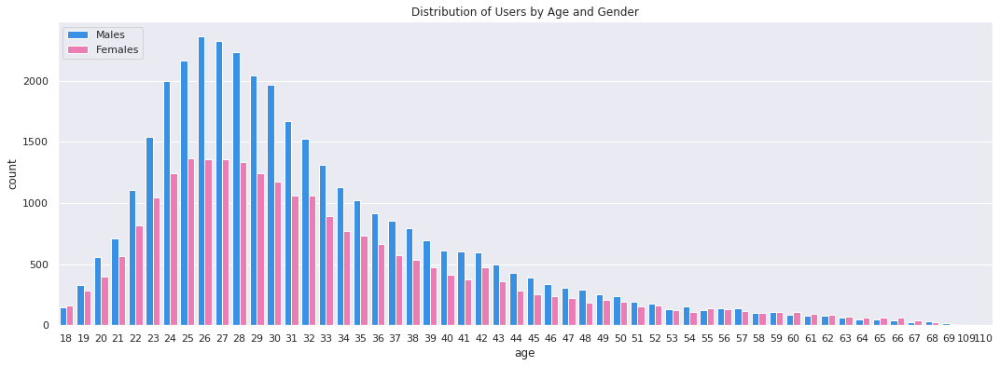

In [44]:
plt.figure(figsize=(16, 6))
sns.countplot(x = 'age', hue = 'sex', data = justCA, palette = ['dodgerblue','hotpink'])
plt.title('Distribution of Users by Age and Gender')
plt.legend(['Males','Females']);

From the graph above, we see that there are a lot more men in the app than females (about a 2:1 ratio). This is likely not representative of the SF population, and a result of the bias of using a dating app. In addition, we can see that most of the users are in their 20s and 30s.

# Comparing the Distribution of Drinking Levels for Males and Females

A significant number of people chose to report their drinking habits, which makes sense since people will typically choose to meet up after a dating app conversation for drinks. Drinks are casual and make it easy for people to loosen up and have a conversation. Thus, we compare the drinking habits of the users between males and females.

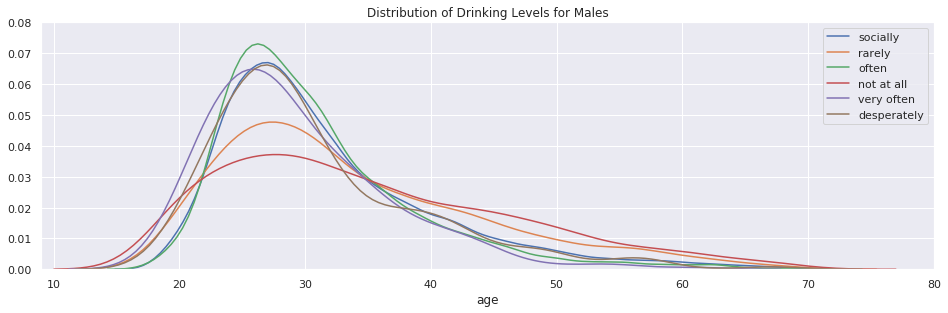

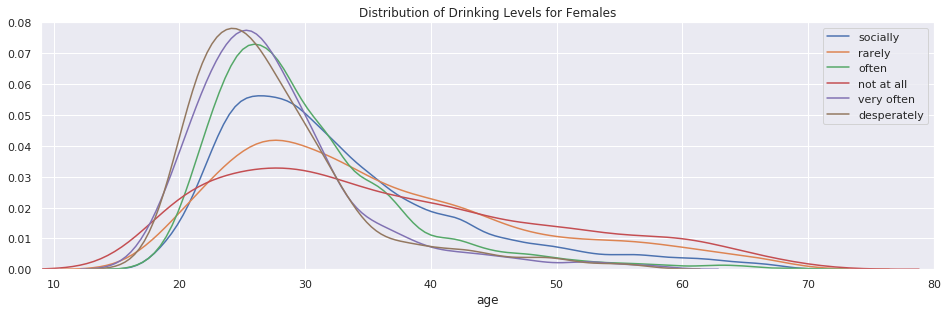

In [7]:
plt.figure(figsize=(16, 10))
plt.subplot(212)
drinking_level = justCA['drinks'].value_counts().index
for level in drinking_level:
    sns.distplot(justCA.loc[(justCA['drinks']==level) & (justCA['sex']=='m')]['age'], label = level, hist=False)
plt.axis([9, 80, 0, .08])
plt.title('Distribution of Drinking Levels for Males')
plt.legend();

plt.figure(figsize=(16, 10))
plt.subplot(212)
for level in drinking_level:
    sns.distplot(justCA.loc[(justCA['drinks']==level) & (justCA['sex']=='f')]['age'], label = level, hist=False)
plt.axis([9, 80, 0, .08])
plt.title('Distribution of Drinking Levels for Females')
plt.legend()

There is a peak in frequency, about 7%, with men in their mid to late 20s who drink 'often.' We see 'socially,' 'desperately,' and 'very often' levels at slightly lower peaks during the same age range. However, as the men reach their mid-30s, all the drinking levels (except ‘desperately’) have the same frequency of men. 

For women, the highest frequencies are for 'desperately' and ‘very often’ levels when they are in their mid-20s. These frequencies reach close to 8%. Looking at women in their mid-30s, 'desperately' and 'very often' quickly drop to the two lowest levels. 

For both genders, we see very few people drinking ‘rarely' or 'not at all.' It is clear that most people on this app enjoy drinking with women having relatively earlier and higher peaks in heavy drinking.

# Regression for Gender and Height

We see there is a slight relationship between the gender and the different heights of the OKCupid users. Using a classification modeling technique, we see how accurately we can predict gender by a given height.

In [8]:
convert = {'m': 1, 'f': 0}
justCA['num_sex'] = pd.Series.map(justCA['sex'],convert)
justCA.head(3)

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,age,body_type,diet,drinks,drugs,education,essay0,essay1,essay2,essay3,...,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,num_sex
0,22,a little extra,strictly anything,socially,never,working on college/university,about me:<br />\n<br />\ni would love to think...,currently working as an international agent fo...,making people laugh.<br />\nranting about a go...,"the way i look. i am a six foot half asian, ha...",...,"doesn&rsquo;t have kids, but might want them",straight,likes dogs and likes cats,agnosticism and very serious about it,m,gemini,sometimes,english,single,1
1,35,average,mostly other,often,sometimes,working on space camp,i am a chef: this is what that means.<br />\n1...,dedicating everyday to being an unbelievable b...,being silly. having ridiculous amonts of fun w...,NaN,...,"doesn&rsquo;t have kids, but might want them",straight,likes dogs and likes cats,agnosticism but not too serious about it,m,cancer,no,"english (fluently), spanish (poorly), french (...",single,1
2,38,thin,anything,socially,NaN,graduated from masters program,"i'm not ashamed of much, but writing public te...","i make nerdy software for musicians, artists, ...",improvising in different contexts. alternating...,my large jaw and large glasses are the physica...,...,NaN,straight,has cats,NaN,m,pisces but it doesn&rsquo;t matter,no,"english, french, c++",available,1


In [9]:
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff
import cufflinks as cf
cf.set_config_file(offline=False, world_readable=True, theme='ggplot')

In [10]:
justF = justCA[justCA['num_sex']==0]
justM = justCA[justCA['num_sex']==1]

trace0 = go.Scatter(x = justF['height'],y = justF['num_sex'], name = 'Females', mode = 'markers', 
                    marker = dict(color ='hotpink',opacity=0.5))
trace1 = go.Scatter(x = justM['height'],y = justM['num_sex'], name = 'Males', mode = 'markers', 
                    marker = dict(color ='dodgerblue',opacity=0.5))
layout = go.Layout(title=go.layout.Title(text="Looking at Height by Gender"),
                   xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text='Height')),
                   yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text='Gender')))
py.iplot(go.Figure(data=[trace1, trace0], layout=layout))

Due to over-plotting, we jitter the data.

In [11]:
jitter_y0 = justF['num_sex'] + 0.15 * np.random.rand(justF['num_sex'].size) -0.07
jitter_y1 = justM['num_sex'] + 0.15 * np.random.rand(justM['num_sex'].size) -0.07

trace0 = go.Scatter(x = justF['height'],y = jitter_y0, name = 'Females', mode = 'markers', 
                    marker = dict(color ='hotpink',opacity=0.5))
trace1 = go.Scatter(x = justM['height'],y = jitter_y1, name = 'Males', mode = 'markers', 
                    marker = dict(color ='dodgerblue',opacity=0.5))
py.iplot(go.Figure(data=[trace1, trace0], layout=layout))

We chose to use a logistic regression as our model since the two categories are fairly close to one another.

In [12]:
cleanCA = justCA[['height','num_sex']].dropna()
X = cleanCA[['height']].values
Y = cleanCA['num_sex'].values.astype(float)

In [13]:
import sklearn.linear_model as linear_model
model = linear_model.LogisticRegression(solver='lbfgs')
model.fit(X,Y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='lbfgs',
          tol=0.0001, verbose=0, warm_start=False)

In [14]:
jitter_y = Y + 0.15*np.random.rand(len(Y)) - 0.07
points = go.Scatter(name="Jittered Data", x=np.squeeze(X), y = jitter_y, mode="markers", 
                    marker=dict(opacity=0.5, color="black"))

X_plt = np.linspace(np.min(X), np.max(X), 10)
model_line = go.Scatter(name="Logistic Model", x=X_plt, y=model.predict(X_plt[:,np.newaxis]), mode="lines", 
                        line=dict(color="orange"))
py.iplot(go.Figure(data=[points, model_line], layout=layout))

For our simple decision rule, we decide that a user is male if our model predicts a value above 0.5. This creates a decision boundary that declares all the users on the left of the boundary are females while the points to the right are male. 

In [15]:
ind_male=model.predict(X) > 0.5

We will now be developing a classifier based on this simple rule.

In [16]:
male_points = go.Scatter(name="Classified as Males", 
                    x=np.squeeze(X[ind_male]), y = jitter_y[ind_male], 
                    mode="markers", marker=dict(opacity=0.5, color="dodgerblue"))
female_points = go.Scatter(name="Classified as Females", 
                    x=np.squeeze(X[~ind_male]), y = jitter_y[~ind_male], 
                    mode="markers", marker=dict(opacity=0.5, color="hotpink"))
dec_boundary = (0.5 - model.intercept_[0])/model.coef_[0][0]
dec_line = go.Scatter(name="Decision Boundary", 
                      x = [dec_boundary,dec_boundary], y=[-0.5,1.5], mode="lines",
                     line=dict(color="black", dash="dot"))
py.iplot(go.Figure(data=[male_points, female_points, model_line,dec_line], layout=layout))

To test the accuracy of our model and classifier, we compute the zero one loss.

In [17]:
from sklearn.metrics import zero_one_loss
zerooneloss= zero_one_loss(Y, model.predict(X)>.05)
print("Data incorrect:", zerooneloss)

Data incorrect: 0.1694651897148013


# Looking at Education Levels by Gender

Another relationship we want to explore is how the education level of our sample changes based on each gender. 

Since there are many different options for education level, we reduced the education variable to what we felt were its core components. Instead of dealing with 24 possible combinations for education, we chose to group the education variables solely based on where their education came from, regardless of whether they had graduated or were still a student. Drop outs, regardless of where, were grouped into one variable. All answers with “space camp” were dropped. As a result of this, we have a smoothed education variable set of 8 possibilities from which to conduct an analysis from:
- Dropouts
- High School
- Two-Year College
- College
- Masters
- Med School
- Law School
- PhD

In [18]:
df1 = pd.DataFrame()

for i in ['m','f']:
    d = justCA[justCA['sex']==i]
    dropOuts = d[d['education'].str.contains('dropped out of', na=False)].index.size
    
    noDropOuts = d[~d['education'].str.contains('dropped out of', na=False)]
    college = noDropOuts[noDropOuts['education'].str.contains('college/university',na=False)].index.size
    masters = noDropOuts[noDropOuts['education'].str.contains('masters',na=False)].index.size
    twoYear = noDropOuts[noDropOuts['education'].str.contains('two-year college',na=False)].index.size
    highSchool = noDropOuts[noDropOuts['education'].str.contains('high school',na=False)].index.size
    med = noDropOuts[noDropOuts['education'].str.contains('med school',na=False)].index.size
    law = noDropOuts[noDropOuts['education'].str.contains('law school',na=False)].index.size
    phd = noDropOuts[noDropOuts['education'].str.contains('ph.d',na=False)].index.size
    
    levels = np.array([dropOuts,highSchool,twoYear,college,masters,med,law,phd])
    
    col = pd.DataFrame(data = levels)
    df1[i] = col.iloc[:,0]
df1

,m,f
0,1583,522
1,1153,456
2,1851,970
3,17926,12504
4,5585,5178
5,359,310
6,774,631
7,1505,772


In [19]:
df2 = df1.rename(index={0:'dropOuts',1:'highSchool', 2:'twoYear',3:'college',4:'masters',5:'med',6:'law',7:'phd'})
df2

,m,f
dropOuts,1583,522
highSchool,1153,456
twoYear,1851,970
college,17926,12504
masters,5585,5178
med,359,310
law,774,631
phd,1505,772


Due to the difference in males and female users, we decided to plot the frequency of each education level rather than total count.

In [20]:
for i in range(2):
    col = df2.iloc[:, i] # i^th column
    colSum = df2.iloc[:, i].sum() # sum of all counts in i^th column
    df2.iloc[:, i] = col/colSum
df2

,m,f
dropOuts,0.051503,0.024458
highSchool,0.037513,0.021365
twoYear,0.060223,0.045448
college,0.583225,0.585860
masters,0.181709,0.242609
med,0.011680,0.014525
law,0.025182,0.029565
phd,0.048965,0.036171


Text(0.5, 1.0, 'Frequency of Males and Females at Each Education Level')

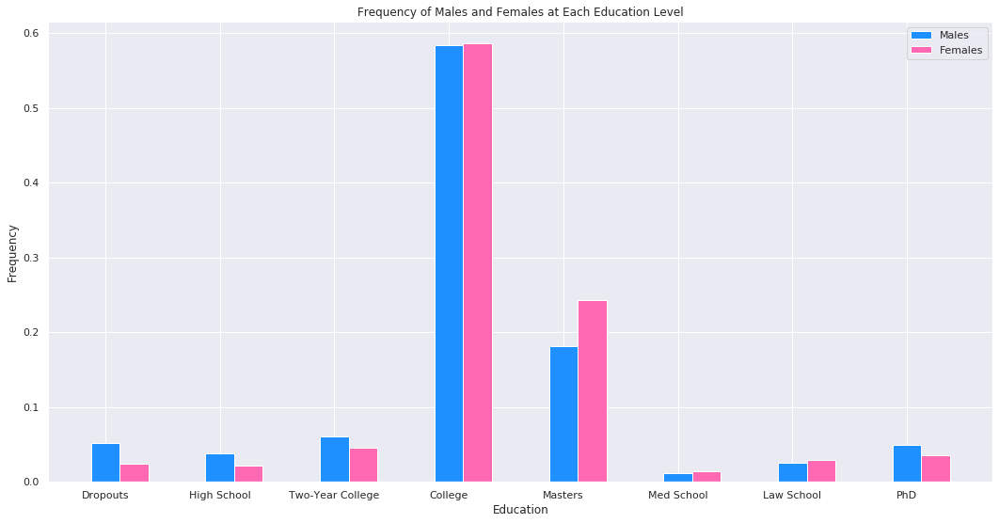

In [21]:
plt.figure(figsize=(18, 9))

X = np.arange(len(df2))
width = 0.25
plt.bar(X, df2['m'], width, color = 'dodgerblue', label='Males')
plt.bar(X+width, df2['f'], width, color = 'hotpink', label='Females')

labels=['Dropouts','High School','Two-Year College','College','Masters','Med School','Law School','PhD']
plt.xticks(X, labels)
plt.legend()
plt.xlabel('Education')
plt.ylabel('Frequency')
plt.title('Frequency of Males and Females at Each Education Level')

We can see that while about the same percentage of males and females receive a college education, there are significant differences in other categories. Males are twice as likely to be a dropout than females. In addition, females are more likely to be working on/have completed their masters. We conclude that females are better receiving a general/standard education, but at the absolute highest level, males will compose more of population.

# Trends in Responses

We now look at people's responses to the essay questions. We explore the differences in male and female responses.

In [22]:
%matplotlib inline
plt.style.use('fivethirtyeight')
import seaborn as sns
sns.set()
sns.set_context("talk")
import re

pd.options.mode.chained_assignment = None
pd.set_option('max_colwidth', 280)

In [23]:
import re
import string
import nltk
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import stopwords
from nltk import word_tokenize

stop_words = set(stopwords.words('english'))
punct = string.punctuation

[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/jovyan/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


We separate the data into two halves, one for males and one for females.

In [24]:
justCAMales = justCA[justCA.sex == 'm']
justCAMales.head(3)

,age,body_type,diet,drinks,drugs,education,essay0,essay1,essay2,essay3,...,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,num_sex
0,22,a little extra,strictly anything,socially,never,working on college/university,"about me:<br />\n<br />\ni would love to think that i was some some kind of intellectual:\neither the dumbest smart guy, or the smartest dumb guy. can't say i\ncan tell the difference. i love to talk about ideas and concepts. i\nforge odd metaphors instead of reciting cliches...","currently working as an international agent for a freight\nforwarding company. import, export, domestic you know the\nworks.<br />\nonline classes and trying to better myself in my free time. perhaps\na hours worth of a good book or a video game on a lazy sunday.","making people laugh.<br />\nranting about a good salting.<br />\nfinding simplicity in complexity, and complexity in simplicity.","the way i look. i am a six foot half asian, half caucasian mutt. it\nmakes it tough not to notice me, and for me to blend in.",...,"doesn&rsquo;t have kids, but might want them",straight,likes dogs and likes cats,agnosticism and very serious about it,m,gemini,sometimes,english,single,1
1,35,average,mostly other,often,sometimes,working on space camp,i am a chef: this is what that means.<br />\n1. i am a workaholic.<br />\n2. i love to cook regardless of whether i am at work.<br />\n3. i love to drink and eat foods that are probably really bad for\nme.<br />\n4. i love being around people that resemble line 1-3.<br />\ni ...,dedicating everyday to being an unbelievable badass.,being silly. having ridiculous amonts of fun wherever. being a\nsmart ass. ohh and i can cook. ;),NaN,...,"doesn&rsquo;t have kids, but might want them",straight,likes dogs and likes cats,agnosticism but not too serious about it,m,cancer,no,"english (fluently), spanish (poorly), french (poorly)",single,1
2,38,thin,anything,socially,NaN,graduated from masters program,"i'm not ashamed of much, but writing public text on an online\ndating site makes me pleasantly uncomfortable. i'll try to be as\nearnest as possible in the noble endeavor of standing naked before\nthe world.<br />\n<br />\ni've lived in san francisco for 15 years, and both lo...","i make nerdy software for musicians, artists, and experimenters to\nindulge in their own weirdness, but i like to spend time away from\nthe computer when working on my artwork (which is typically more\nconcerned with group dynamics and communication, than with visual\nform, o...","improvising in different contexts. alternating between being\npresent and decidedly outside of a moment, or trying to hold both\nat once. rambling intellectual conversations that hold said\nconversations in contempt while seeking to find something that\ntranscends them. being...","my large jaw and large glasses are the physical things people\ncomment on the most. when sufficiently stimulated, i have an\nunmistakable cackle of a laugh. after that, it goes in more\ndirections than i care to describe right now. maybe i'll come back\nto this.",...,NaN,straight,has cats,NaN,m,pisces but it doesn&rsquo;t matter,no,"english, french, c++",available,1


In [25]:
justCAFemales = justCA[justCA.sex == 'f']
justCAFemales.head(3)

,age,body_type,diet,drinks,drugs,education,essay0,essay1,essay2,essay3,...,offspring,orientation,pets,religion,sex,sign,smokes,speaks,status,num_sex
6,32,fit,strictly anything,socially,never,graduated from college/university,life is about the little things. i love to laugh. it's easy to do\nwhen one can find beauty and humor in the ugly. this perspective\nmakes for a more gratifying life. it's a gift. we are here to play.,digging up buried treasure,frolicking<br />\nwitty banter<br />\nusing my camera to extract sums of a whole and share my perspective\nwith the world in hopes of opening up theirs<br />\nbeing amused by things most people would miss,i am the last unicorn,...,NaN,straight,likes dogs and likes cats,NaN,f,virgo,NaN,english,single,0
7,31,average,mostly anything,socially,never,graduated from college/university,NaN,"writing. meeting new people, spending time with friends, seeing\nfilms, going to literary events and lectures, sifting through\nbookstores and thrift stores, exploring the city. i also work full\ntime at an interactive agency.","remembering people's birthdays, sending cards, being thoughtful,\narm wrestling",i'm rather approachable (a byproduct of being from a small town in\nthe midwest).,...,"doesn&rsquo;t have kids, but wants them",straight,likes dogs and likes cats,christianity,f,sagittarius,no,"english, spanish (okay)",single,0
8,24,NaN,strictly anything,socially,NaN,graduated from college/university,NaN,"oh goodness. at the moment i have 4 jobs, so it'd be nice to find\none i could settle into. other than that, i'm making sure i'm\nsurrounded by good people and keeping happy and active",NaN,i'm freakishly blonde and have the same name as that hurricane from\na while back.,...,doesn&rsquo;t have kids,straight,likes dogs and likes cats,christianity but not too serious about it,f,gemini but it doesn&rsquo;t matter,when drinking,english,single,0


Let's preprocess the essay responses to "The six things I could never do without" by. We define a function to complete the following steps:

1. Dropping all empty responses.

2. Coverting all words to lower case.

3. Removing HTML tags and new line characters.

4. Removing numbers and punctuation.

5. Tokenizing
    
6. Removing stop words & preposition/adjectives. 

In [26]:
def essayProcessing(df, essay, newColName):

    # Drop NA values
    df = df.dropna()

    df[newColName] = "" # add a new column

    # Convert to lowercase and remove leading/trailing whitespace
    df[newColName] = (df[essay].str.lower().str.strip())

    # Removing HTML brackets
    df[newColName] = df[newColName].str.replace(r'<[^>]+>', ' ')

    # Removing new lines
    df[newColName] = df[newColName].str.replace(r'\n', ' ')

    # Remove Punctuation
    punct_regex = r'[^\w\s]'
    df[newColName] = df[newColName].str.replace(punct_regex, ' ')

    # Remove Numbers
    num_regex = r'[\d]'
    df[newColName] = df[newColName].str.replace(num_regex, ' ')

    # Extract the keywords (exclude stop words)
    df[newColName] = (df[newColName].apply(lambda x: ' '.join
                                           ([word for word in x.split() if word not in stop_words])))

    # Tokenize the plots using word_tokenize  (use .apply like above)
    df[newColName] = df[newColName].apply(word_tokenize)
    
    return df

The above code returns a dataframe with a new column filled with the tokenized responses of an essay response. We now run our male and female separated dataframes through it.

In [27]:
justCAFemales = essayProcessing(justCAFemales, 'essay5', 'response5')
justCAMales = essayProcessing(justCAMales, 'essay5', 'response5')

In [28]:
justCAFemales.head(3)

,age,body_type,diet,drinks,drugs,education,essay0,essay1,essay2,essay3,...,orientation,pets,religion,sex,sign,smokes,speaks,status,num_sex,response5
98,31,curvy,anything,socially,sometimes,graduated from masters program,one day i will mod r/hotchickswithspreadsheets.<br />\n<br />\ni &lt;3 data and jokes about fart jokes. my hobbies include\nwikipedia and chortling. i write raps that no one will hear. i do\nnot have a booty like minaj.,"presently, holyshitwhatamidoinghere and the spacetime continuum.\nprofessionally, i count shoes.","algebra, alliteration, big spoon and little spoon.",i look a lot like that chick you banged your freshman year in\ncollege. i am a honda civic.,...,straight,likes dogs,atheism,f,pisces,no,english (fluently),single,0,"[civility, hope, basic, arithmetic, vital, organs, toilet, paper, giggling]"
106,45,fit,mostly anything,socially,never,graduated from masters program,"i'm a glass-half-full kind of girl, am emotionally wired to be very\nlogical, and abhor drama. i'm eternally curious and work in\nleft-brain things, but enjoy right-brain activities much more ....\ndrawing or creating things. i over-analyze everything, so almost\nnever regret...","i need to continually learn or else i get bored. i try to visit a\nnew place every year. i like to try new experiences. skydiving is\nnext. i tend to order those things i have never eaten/drunk before.\ni try to keep all my relationships in good order, so that i have\nnothing...",- making people feel comfortable<br />\n- finding the optimistic viewpoint when providing advice<br />\n- over-analyzing,- easy smile &amp; dimples,...,straight,likes dogs,agnosticism and laughing about it,f,aries but it doesn&rsquo;t matter,no,english (fluently),single,0,"[love, family, friends, large, variety, great, food, fresh, fruit, intellectual, stimulation, means, use, passport, extensively, phone, internet, prospect, romantic, love]"
113,23,curvy,mostly anything,rarely,never,working on college/university,"hey<br />\ni'm angel, here's a little about myself. i am a born an raised\ncalifornian, whoo. been in the bay area for a while now. i'm a bit\nof a tomboy. i love video games, football (go niners), hiking, that\nkinda stuff. got to love the earth, so i try to stay conscious\n...",discovering and exploring! finding myself.<br />\ntake care of business and working to get what i need and want out\nof life.,"art, math, learnin things fast, puzzles and brain teasers, picking\nout the perfect gift, most games i play, making things by hand, and\nbeing efficient (when i want to).",i'd say my hair and my eyes. i would say my smile but i'm not\nsure.<br />\ni like my lips a lot tho.,...,straight,likes dogs and likes cats,other,f,capricorn and it&rsquo;s fun to think about,when drinking,english (fluently),single,0,"[uumm, well, music, thats, one, love, food, might, given, good, disney, movie, two, uumm, humm, video, games, nice, warm, showers, people, maybe, art]"


In [29]:
justCAMales.head(3)

,age,body_type,diet,drinks,drugs,education,essay0,essay1,essay2,essay3,...,orientation,pets,religion,sex,sign,smokes,speaks,status,num_sex,response5
0,22,a little extra,strictly anything,socially,never,working on college/university,"about me:<br />\n<br />\ni would love to think that i was some some kind of intellectual:\neither the dumbest smart guy, or the smartest dumb guy. can't say i\ncan tell the difference. i love to talk about ideas and concepts. i\nforge odd metaphors instead of reciting cliches...","currently working as an international agent for a freight\nforwarding company. import, export, domestic you know the\nworks.<br />\nonline classes and trying to better myself in my free time. perhaps\na hours worth of a good book or a video game on a lazy sunday.","making people laugh.<br />\nranting about a good salting.<br />\nfinding simplicity in complexity, and complexity in simplicity.","the way i look. i am a six foot half asian, half caucasian mutt. it\nmakes it tough not to notice me, and for me to blend in.",...,straight,likes dogs and likes cats,agnosticism and very serious about it,m,gemini,sometimes,english,single,1,"[food, water, cell, phone, shelter]"
19,33,athletic,mostly anything,socially,never,graduated from masters program,"i relocated to san francisco half a year ago. that was an awesome\nfew months that let me explore the diverse parts of the city, find\na gorgeous victorian house to live in, meet my awesome roommates\nwho became my best friends, find my first american emotional\nsoul-mates, r...","i left my comfort zone far behind in europe, and enjoyed a few\nmonths of a fast-paced adventure here. at the same time i was doing\nmy best to settle down and it seems it worked well ;-)<br />\n<br />\nbeing in the central game-development technology hub, i'm taking\nadvanta...","listening, connecting emotionally, analyzing tough engineering\ntasks, making people laugh, dancing boogie woogie, horseback\nriding, yoga, swimming, playing chess, and guitar hero, driving\ndynamically, driving gently, taking good photos, and listening to\nmy intuition.","cheerful, open, curious, direct, active, sporty, energetic.",...,straight,likes dogs and likes cats,catholicism but not too serious about it,m,pisces and it&rsquo;s fun to think about,no,english (fluently),single,1,"[juicy, fruit, water, swimming, workouts, yoga, practice, dearest, friends, good, hifi, music, system, home]"
22,30,fit,mostly anything,socially,never,graduated from college/university,"i tend to think the same way a comedian does about nearly\neverything and i laugh more than any other particular activity.\nadventures are a key ingredient to my happiness, whether it be a\nnew restaurant, hike, or sport i'm usually forging ahead toward\nsomething new. you co...","i'm a supply and demand manager for a sustainable soap manufacturer\nhere in sf. the typical corporation sort of sucks the life out of\nmy being, so working for companies with a positive mission is key\nfor me. aside from operations work, i am currently learning to cook\n(bet...","making predictions, planning anything (i'm pretty thorough when\nmotivated), writing, making people laugh (yes, often at me), and\novereating/drinking followed by an appropriately guilty run through\nthe park.",that i'm smiling. pretty much at all times.,...,straight,likes dogs and likes cats,agnosticism and somewhat serious about it,m,sagittarius but it doesn&rsquo;t matter,no,"english, spanish (poorly)",single,1,"[sf, restaurants, could, better, friends, beer, going, places, never, board, sports, bicycle, smartass, comedy]"


Since we are looking at the 6 **things** that people could never do without, we process the tokens again by taking out all of the words that aren't nouns. The function below returns a list of nouns from the token list.

In [30]:
from gensim.corpora.dictionary import Dictionary

def getNouns(df, responseColumn):
    # Processing Keywords
    processed_keywords=[]
    for keywords in df[responseColumn]:
        processed_keywords.append(keywords)
    
    dictionary = Dictionary(processed_keywords)

    ### concatenate all keywords from all responses together
    allResponses=[]
    for word in processed_keywords:
        allResponses.extend(word) 

    # getting rid of all non-nouns
    tagged = nltk.pos_tag(allResponses)

    nouns = [word for word,pos in tagged if (pos == 'NN' or pos == 'NNP' or pos == 'NNS' or pos == 'NNPS')]
    return nouns

Now we run our function to get the list of all nouns used by males and females.

In [31]:
femaleTop6Things = getNouns(justCAFemales, 'response5')
maleTop6Things = getNouns(justCAMales, 'response5')

This function plots the frequency of the list of words. We run it on both males and females to compare the most popular words.

In [32]:
from nltk import FreqDist
def plot_freq_words(words, terms=10):

    fdist = FreqDist(words)
    words_df = pd.DataFrame({'word':list(fdist.keys()), 'count':list(fdist.values())})

    # selecting top most frequent words
    d = words_df.nlargest(columns="count", n=terms) 
    plt.figure(figsize=(20,5))
    ax = sns.barplot(data=d, x="word", y="count")
    ax.set(ylabel = 'Count', title='Most Common \'6 Things\' Cannot Do Without')
    plt.show()

## Females

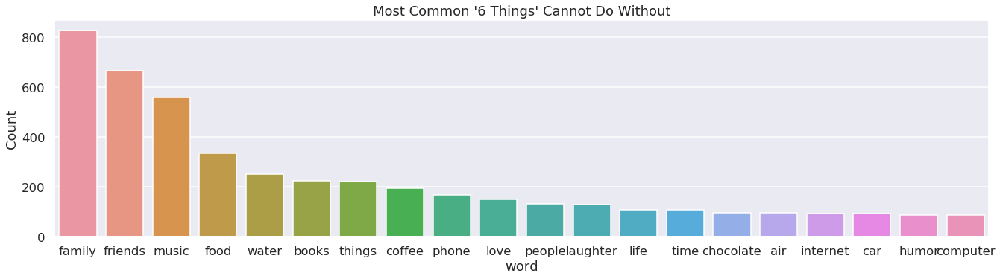

In [33]:
plot_freq_words(femaleTop6Things, 20)

# Males

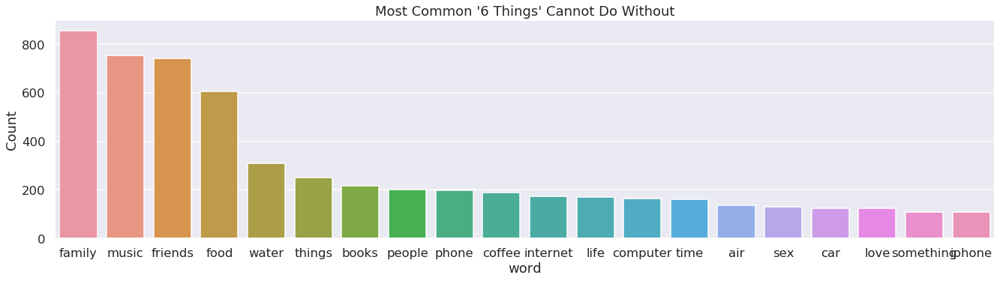

In [34]:
plot_freq_words(maleTop6Things, 20)

We can see from the two plots above that males and females in general have fairly similar "top 6" things they couldn't live without. However, we want to investigate the differences between males and females, so we subtract each other's similar words and form two new lists comprising of the words that one gender has but not the other.

In [35]:
# maleMinusFem = list(set(maleTop6Things) - set(femaleTop6Things))
# femMinusMale = list(set(femaleTop6Things) - set(maleTop6Things))

maleMinusFem = [x for x in maleTop6Things if x not in femaleTop6Things]
femMinusMale = [x for x in femaleTop6Things if x not in maleTop6Things]

# Males without Females

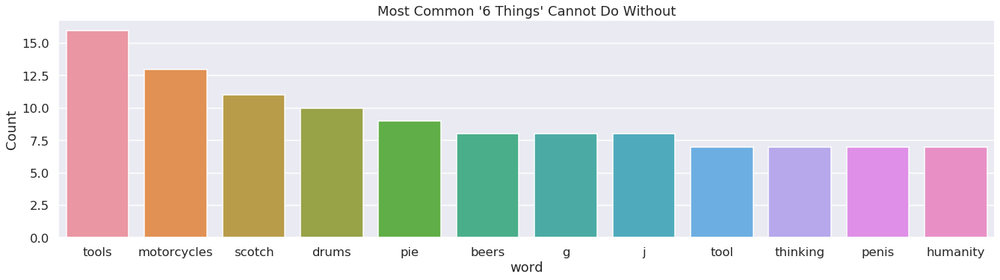

In [36]:
plot_freq_words(maleMinusFem, 12)

# Females without Males

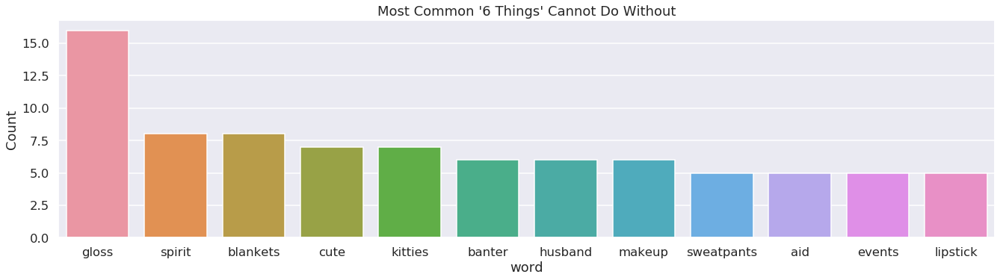

In [37]:
plot_freq_words(femMinusMale, 12)

We can see that there is a big difference in the words that males and females on the dating app using when you filter out all the things that they share in common. Males brought up more stereotypically masculine things, such as tools, motorcycles, scoth, drums, and beers. Females brought up more stereotypically feminine things, such as gloss, kitties, and makeup.

In [38]:
# maleMinusFem = list(set(maleTop6Things) - set(femaleTop6Things))
# femMinusMale = list(set(femaleTop6Things) - set(maleTop6Things))

maleMinusFem = [x for x in maleTop6Things if x not in femaleTop6Things]
femMinusMale = [x for x in femaleTop6Things if x not in maleTop6Things]

# Males without Females

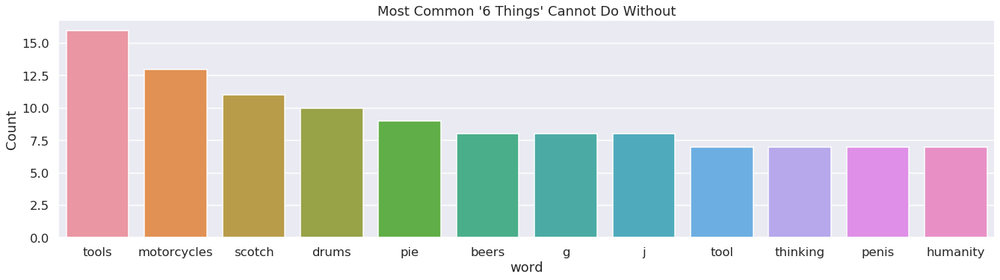

In [39]:
plot_freq_words(maleMinusFem, 12)

# Females without Males

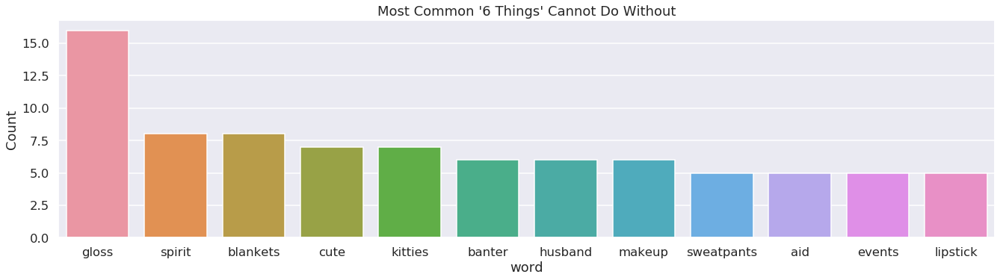

In [40]:
plot_freq_words(femMinusMale, 12)

We can see that there is a big difference in the words that males and females on the dating app using when you filter out all the things that they share in common. Males brought up more stereotypically masculine things, such as tools, motorcycles, scoth, drums, and beers. Females brought up more stereotypically feminine things, such as gloss, kitties, and makeup.

# Conclusion



In [48]:
_ = ok.submit()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Saving notebook... Could not automatically save 'int15-final-project.ipynb'
Make sure your notebook is correctly named and saved before submitting to OK!
Making a best attempt to submit latest 'int15-final-project.ipynb', last modified at Sat Jun 15 06:12:04 2019
Submit... 0.0% complete
Could not submit: Late Submission of ucsb/int15/sp19/final_project

